# **MACHINE LEARNING MINI PROJECT(BASIC)**

AUTHOR


STUDENT NAME : MOKSHITH KUMMARI

STUDENT ID : 210650383



# 2)PROBLEM FORMULATION

Basic solution : Using the MLEnd Hums and Whistles dataset, I builT a machine learning pipeline that takes as an input a Potter or a StarWars audio segment and predicts its song label (either Harry or StarWars).

#7)  DATASET



In [1]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive') # Drive mount

Mounted at /content/drive


In [ ]:
path = '/content/drive/MyDrive/data1/dataset/sample/set/' #Path of the dataset
os.listdir(path) #displays the file names

Now, We extract the audio files from Zip format.

In [3]:
#directory_to_extract_to = '/content/drive/MyDrive/data1/dataset/sample/'   # Code to extract files from zip file
#zip_path = '/content/drive/MyDrive/data1/dataset/MLend.zip'
#with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    #zip_ref.extractall(directory_to_extract_to)

sample_path = '/content/drive/MyDrive/data1/dataset/sample/set/*.wav'
files = glob.glob(sample_path)
len(files) #length of files

810

In [4]:
for _ in range(5):
  n = np.random.randint(810) #Displaying random five audio files 
  display(ipd.Audio(files[n]))

In [5]:
for file in files:
  print(file.split('/')[-1]) 

S120_whistle_2_Potter.wav
S120_hum_2_StarWars.wav
S120_hum_2_Potter.wav
S120_whistle_2_StarWars.wav
S121_hum_1_Potter.wav
S121_hum_2_Potter.wav
S121_hum_3_StarWars.wav
S121_hum_4_StarWars.wav
S122_hum_2_StarWars.wav
S122_hum_2_Potter.wav
S123_hum_2_Starwars.wav
S122_whistle_2_Potter.wav
S122_whistle_2_StarWars.wav
S123_whistle_2_Starwars.wav
S124_Hum_2_Potter.wav
S124_Hum_2_StarWars.wav
S124_Whistle_2_Potter.wav
S124_Whistle_2_StarWars.wav
S125_hum_2_Potter.wav
S125_hum_2_StarWars.wav
S125_whistle_2_Potter.wav
S125_whistle_2_StarWars.wav
S126_hum_2_Potter.wav
S126_hum_2_StarWars.wav
S126_whistle_2_Potter.wav
S126_whistle_2_StarWars.wav
S127_hum_1_Potter.wav
S127_hum_2_Potter.wav
S128_hum_1_Potter.wav
S127_hum_4_StarWars.wav
S128_hum_3_StarWars.wav
S128_hum_2_Potter.wav
S127_hum_3_StarWars.wav
S128_hum_4_StarWars.wav
S129_hum_2_StarWars.wav
S129_whistle_2_Potter.wav
S129_hum_2_Potter.wav
S129_whistle_2_StarWars.wav
S12_hum_2_Potter .wav
S12_hum_3_StarWars.wav
S12_hum_4_Potter .wav
S12_h

In [6]:
print('The full path to the first audio file is: ', files[0]) #Displaying the path of first audio file
print('\n')
print('The name of the first audio file is: ', files[0].split('/')[-1]) #Name of the first audio file
print('    The participant ID is: ', files[0].split('/')[-1].split('_')[0]) #Participant ID of the first audio file
print('    The type of interpretation is: ', files[0].split('/')[-1].split('_')[1]) # Interpretation of the first audio file
print('    The interpretation number is: ', files[0].split('/')[-1].split('_')[2]) #Interpretation number of the first audio file
print('    The song is: ', files[0].split('/')[-1].split('_')[3]) #The song label of the first audio file

The full path to the first audio file is:  /content/drive/MyDrive/data1/dataset/sample/set/S120_whistle_2_Potter.wav


The name of the first audio file is:  S120_whistle_2_Potter.wav
    The participand ID is:  S120
    The type of interpretation is:  whistle
    The interpretation number is:  2
    The song is:  Potter.wav


Lets, now create a dataframe from the audio files given.



In [8]:
MLENDHW_table = [] #Making a dataframe from the files

for file in files:
  try:
   file_name = file.split('/')[-1]
   participant_ID = file.split('/')[-1].split('_')[0]
   interpretation_type = file.split('/')[-1].split('_')[1]
   interpretation_number = file.split('/')[-1].split('_')[2]
   song = file.split('/')[-1].split('_')[3].split('.')[0]
   if song == "Potter" or  "potter" or "StarWars" or "starwars" or"StarWar" or "imperial":
       MLENDHW_table.append([file_name,participant_ID,interpretation_type,interpretation_number, song])
  except:
   continue
MLENDHW_table
len(MLENDHW_table)

810

We can see that the length of the dataframe matches with the length of files.

In [9]:
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','participant','interpretation','number','song']).set_index('file_id')
MLENDHW_df # Dataframe display

,participant,interpretation,number,song
file_id,,,,
S120_whistle_2_Potter.wav,S120,whistle,2,Potter
S120_hum_2_StarWars.wav,S120,hum,2,StarWars
S120_hum_2_Potter.wav,S120,hum,2,Potter
S120_whistle_2_StarWars.wav,S120,whistle,2,StarWars
S121_hum_1_Potter.wav,S121,hum,1,Potter
...,...,...,...,...
S180_whistle_1_star.wav,S180,whistle,1,star
S180_whistle_2_star.wav,S180,whistle,2,star
S150_hum_1_imperial.wav,S150,hum,1,imperial


In [10]:
MLENDHW_df['song'].value_counts() # Lots of song labels in the given data 

Potter           340
StarWars         319
[Potter]          34
[StarWars]        29
Starwars          21
potter            13
starwars           7
[potter]           4
Imperial           4
Potter             4
[ Star Wars ]      2
StarsWars          2
star               2
2                  2
[StarWars]         2
star wars          2
Star wars          2
starwar            2
Harry              2
[STARWARS]         2
[Potter]           2
1                  2
(starwars)         2
[Starwars]         2
(potter)           2
Potterwav          1
imperial           1
harry potter       1
StartWars          1
[StatWars]         1
Name: song, dtype: int64

Replacing the incorrect format of label names with the correct format of label name. 

In [13]:
 Pre_Dataframe= MLENDHW_df.replace({'song' : { "[Potter]" : "Potter" ,"potter" :"Potter", "[potter]":"Potter","Harry":"Potter","[Potter]":"Potter","(potter)":"Potter","Potterwav":"Potter","harry potter":"Potter","Potter ":"Potter","[Potter] ":"Potter",'Starwars':'StarWars','[StarWars]':'StarWars','Imperial':'StarWars','March':'StarWars','[StarWars] ':'StarWars','star':'StarWars','(starwars)':'StarWars','imperial':'StarWars','starwars':'StarWars','[STARWARS]':'StarWars','StartWars':'StarWars','[ Star Wars ]':'StarWars','[StatWars]':'StarWars','1':'StarWars','2':'StarWars','[Starwars]':'StarWars','starwar':'StarWars','StarsWars':'StarWars','Star wars':'StarWars','star wars':'StarWars' }})

After replacing the labels we can only find Potter and StarWars as song labels.

In [16]:
uniqueValues=Pre_Dataframe['song'].unique() #After replacing the song labels
uniqueValues


array(['Potter', 'StarWars'], dtype=object)

# 4) TRANSFORMATION STAGE

Sampling frequency of a single audio file.

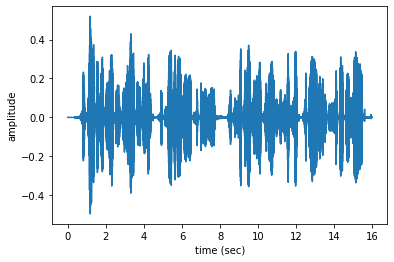

In [17]:
n=0
fs = None # Sampling frequency. If None, fs would be 22050
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n])) #Displaying the sample frequency

Details of the above audio file

In [18]:
Pre_Dataframe.loc[files[n].split('/')[-1]] #Details of S120 audio file

participant          S120
interpretation    whistle
number                  2
song               Potter
Name: S120_whistle_2_Potter.wav, dtype: object

Lets check the samples of audio signal

In [19]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples') #Displays the samples of audio signal

This audio signal has 766976 samples


Lets Normalize the data.

In [22]:
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis) # Data Normalization

In [24]:
def getPitch(x,fs,winLen=0.02): #Feature pitch calculation
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

Feature Extraction from the given audio dataset. 

In [25]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    yi = labels_file.loc[fileID]['song']=='Potter'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
    power = np.sum(x**2)/len(x) #Features Power, Pitch mean, Pitch standard deviation,Fraction of voiced region calculation
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power,pitch_mean,pitch_std,voiced_fr]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

#3) MACHINE LEARNING PIPELINE
Identifying the input and output of the data from the audio set and labels file.

In [27]:
X,y = getXy(files, labels_file=Pre_Dataframe, scale_audio=True, onlySingleDigit=True)

100%|██████████| 810/810 [50:28<00:00,  3.74s/it]


Removing Nan values from the dataset.

In [28]:
# If nan sample, remove them
if np.sum(np.isnan(X)):
  idx = np.isnan(X).sum(1)>0
  X = X[~idx]
  y = y[~idx]
print(np.sum(np.isnan(X)))

0


Displaying the shape of X and y

In [29]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)

The shape of X is (810, 4)
The shape of y is (810,)
The labels vector is [ True False  True False  True  True False False False  True False  True
 False False  True False  True False  True False  True False  True False
  True False  True  True  True False False  True False False False  True
  True False  True False  True False  True False  True False False  True
  True False  True  True False  True False False False  True  True False
  True  True False  True False False  True  True False False False False
 False  True  True False  True False False False  True  True  True  True
  True  True False False False False False  True  True False  True  True
  True False False  True False  True  True False False  True  True False
  True  True False False  True False False  True  True  True  True  True
 False False  True False  True  True False  True False  True False  True
 False False  True False False  True False  True False  True False  True
  True  True False  True False  True  True False  T

As you can see, we have 810 items consisting of 4 features (stored in X) and one binary label (stored in y). Is our dataset balanced? Let's have a look:

In [30]:
print(' The number of Potter recordings is ', np.count_nonzero(y))
print(' The number of StarWars recordings is ', y.size - np.count_nonzero(y))

 The number of Potter recordings is  403
 The number of StarWars recordings is  407


#5) Modelling

Fitting the SVM model to predict the type of song (either Potter or Starwars).
We will use the SVM method provided by scikit-learn and will split the dataset defined by X and y into a training set and a validation set. 

In [31]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((567, 4), (243, 4), (567,), (243,))

Now, we can check the training and validation accuracy using SVM.

In [32]:
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.564373897707231
Validation  Accuracy 0.5843621399176955
The support vectors are (549, 4)


Now, lets normalize the predictors and display the training and validation accuracy.

In [33]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model  = svm.SVC(C=1,gamma=2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.7971781305114638
Validation  Accuracy 0.6337448559670782
The support vectors are (472, 4)


As we can see the training and validation accuracy has been increased after we normalized the predictors.

Now, we can check how the confusion matrix would look for the above results.

              precision    recall  f1-score   support

       False       0.62      0.64      0.63       118
        True       0.65      0.62      0.64       125

    accuracy                           0.63       243
   macro avg       0.63      0.63      0.63       243
weighted avg       0.63      0.63      0.63       243



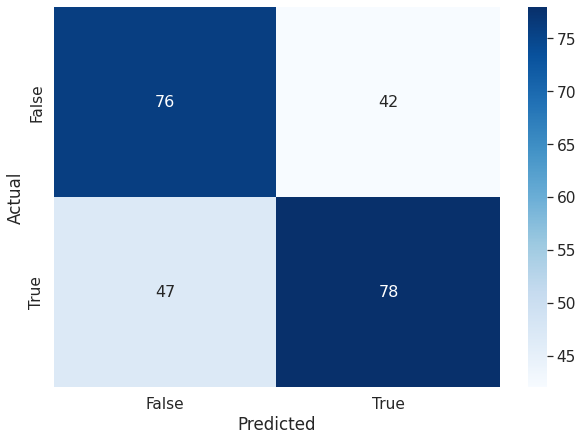

In [39]:
# Printing the confusion matrix
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
import seaborn as sn
con_mat = confusion_matrix(y_val,yv_p)

# Printing the Classification Report
print(classification_report(y_val,yv_p))
df_cm = pd.DataFrame(con_mat, columns=np.unique(yv_p), index = np.unique(yv_p))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

# 8) RESULTS

We can check the accuracy after cross-validating the dataset and get the accuarcy

In [56]:
from sklearn.model_selection import cross_validate
from sklearn.svm import SVC
classification_model = [SVC(kernel='rbf')]
list1 = []
list2 = []
for model in classification_model:
  cv_results = cross_validate(model,X,y,cv=10)
  model_name=type(model).__name__
  print(model_name)
  a = np.average(cv_results['test_score'])
  list1.append(model_name)
  list2.append(a)
  print(a)
df_crossvalidate = pd.DataFrame(data = list2,index = list1,columns=['Accuracy'] )
a = df_crossvalidate.sort_values(by = 'Accuracy',axis = 0, ascending = False)
display(a)

SVC
0.5691358024691358


,Accuracy
SVC,0.569136


After cross-validation we got an accuracy of 56.9. Which has not been increased.



---



# 9) CONCLUSION
We have successfully implemented SVM model to predict the song label(Potter or Starwars).
The accuracy of the classifier seems pretty less even after cross validation. Checking with different classifier we might get an improved accuracy.